# Noise Reduction by Nonlinear Adaptive Denoising
http://web.ics.purdue.edu/~wwtung/2010_GaoSultanHuTung.pdf

## Algorithm
### 1. Algorithm Pseudocode
![image](nad_alg.png)
### 2. Algorithm Code

In [1]:
import numpy as np
import pandas as pd
import cufflinks as cf

X = np.sin(np.linspace(0, 2 * np.pi, 1000))
def nad(X, k, n):
    T = X.shape[0]
    w = 2 * n
    m = int(np.ceil(T / float(n)))
    X = X[:m * n]
    P = []
    for i in range(m):
        P.append(X[i * n : (i + 1) * n ])
    x_hats = []
    for p in P:
        times = np.arange(p.shape[0])
        x_hat = np.poly1d(np.polyfit(times, p, deg = k - 1))
        x_hats.append(x_hat)
    X_hat = [x_hats[0](t) for t in range(n)]
    for i in range(0, m - 1):
        for l in range(n):
            w_1 = (n - l) / float(n)
            w_2 = l / float(n)
            assert w_1 + w_2 == 1
            comp_1 = w_1 * x_hats[i](n + l)
            comp_2 = w_2 * x_hats[i+1](l)
            X_hat.append(comp_1 + comp_2)
    #X_hat.extend([x_hats[m-1](t) for t in range(n)])
    return np.array(X_hat), np.sum(np.square(X_hat - X))
pd.DataFrame(data = np.column_stack([X, nad(X, 2, 100)[0]])).iplot(kind='line')

### 3. Predicted Performance
There do not appear to be any formal guarantees available in the original paper provided. However, it is quite clear that, because of the weighting scheme for overlapping partitions, that the resultant prediction will be continuous. Also, it is clear from internal guarantees by the solution to the least squares optimization problem that each subinterval will be the closest polynomial approximation of order k to the data in the least squares sense. Given this information we can make the following predictions:

* What will work?
  * Input data with high signal to noise ratio
  * Input data in which the signal does not vary with high frequency, so that we can avoid the overfitting effects of using high order polynomials.
  
* What will not work?
  * Input data with high amounts of noise
  * Chaotic input which varys at high frequency

### 4. Data sets to demonstrate good and bad situations
* For the good simulation, we will use EEG data from our data set. This should work well because from visually observing the EEG data it seems as if it could be approximated well by polynomials.
* For the bad simulation, we will use a heart beat data set. This is expected to perform poorly because the signal is very spiky which would require very high degree polynomials to approimate.

### 5. Features of these data sets
* Good data
  * 111 channels with 170,000 timesteps sampled at 500 samples per second. Measured in microvolts.
  
* Bad Data
 * 1 channel with 2000 timesteps, sampled at .5 second intervals. Measured in beats per minute

### 6. Plot Raw Data

In [2]:
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import (download_plotlyjs,
                            init_notebook_mode,
                            plot,
                            iplot)
heart = np.loadtxt('hr.txt')
def plot_heat(M, title):
    data = [
        go.Heatmap(
            z = M
        )
    ]
    layout = go.Layout(
        title = title,
        xaxis=dict(title='time (5ms per cell)'),
        yaxis=dict(title='amplitude in microvolts')
    )
    fig = go.Figure(data=data, layout=layout)
    iplot(fig)
import h5py
data = h5py.File('test.mat', 'r')
eeg_data2 = np.array(data['result']['data'])
plot_heat(eeg_data2.T[:, ::100], 'microVoltage of Channels over time')
pd.DataFrame(data=heart).iplot(kind='line',
                               title='Heart Rate',
                               xTitle='Time',
                               yTitle='beats per minute')

### 7. Predictions
The bad simulation has a lower signal to noise ratio, has a more complicated symbol (e.g. higher frequency and will require higher order polynomials to approximate) and appears vague. This should mean that the algorithm performs poorly on the 'bad' simulation.
On the other hand, the 'good' simulation has a high signal to noise ratio, can be approximated by low polynomials (since it is a polynomial), and is visualy more defined, so we expect the algorithm to perform well in this situation.

## Simulation
### 1. Write sampling / generative distributions
* Good Data will be sampled as follows:
sampled as follows:
    1. Sample m amplitude A sinusoids with randomly selected frequency (both uniformally).
    2. Take samples at T time-steps evenly spaced between 0 and 2 $\pi$ seconds
    3. Sum the m sinusoids, across each timestep (to get a 1 by T array)
    4. Add gaussian noise with 0 mean and high $\sigma$ standard deviation
    
    For the good data case, amplitude will be lower, frequency will be lower, and noise sigma will be lower.

Bad data will be sampled in the same way, except sinusoids will have higher amplitude, frequency, and noise.

### 2. Code

In [3]:
def good_data(T, order, coeff, sigma_noise, num):
    signals = []
    for i in range(num):
        coeffs = coeff * np.random.uniform(-1, 1, order)
        times = np.linspace(-1, 1, T)
        poly = np.poly1d(coeffs) + 5
        sig = []
        for t in times:
            sig.append(poly(t))
        signals.append(np.array(sig))
    signal = np.sum(np.column_stack(signals), axis=1)
    noise = np.random.normal(0, sigma_noise, T)
    return signal, noise, signal + noise, times


def gen_data(T, A_rng, th_rng, sigma_noise, num):
    signals = []
    Al, Ah = A_rng
    thl, thh = th_rng
    for i in range(num):
        A = np.random.uniform(Al, Ah)
        th = np.random.uniform(thl, thh)
        times = np.linspace(0, 2 * np.pi, T)
        sinu = A * np.sin(times * th) + 5
        signals.append(np.array(sinu))
    signal = np.sum(np.column_stack(signals), axis=1)
    noise = np.random.normal(0, sigma_noise, T)
    return signal, noise, signal + noise, times

### 3. What should these simulations look like?
The good simulation should appear to be a low order polynomial with a small amount of additive gaussian noise, so it should be a noisy wave.

The bad simulation should be a high frequency sum of sinusoids with a large amount of gaussian noise, so in the end it should appear to be an extremely messy signal

### 4. Write code to plot simulated data:

In [4]:
def plot(s, n, spn, ind):
    pd.DataFrame(data = s, index=ind).iplot(kind='line',
                                            title='Signal',
                                            xTitle='time',
                                            yTitle='amplitude')
    pd.DataFrame(data = n, index=ind).iplot(kind='line',
                                            title='Noise',
                                            xTitle='time',
                                            yTitle='amplitude')
    pd.DataFrame(data = spn, index=ind).iplot(kind='line',
                                            title='Signal + Noise',
                                            xTitle='time',
                                            yTitle='amplitude')

### 5. Plot simulated data

In [5]:
print 'GOOD DATA'
s, n, spn, ind = gen_data(5000, (1, 2), (5, 10), 2, 5)
plot(s, n, spn, ind)
print 'BAD DATA'
s, n, spn, ind = gen_data(5000, (1, 10), (20, 30), 10, 10)
plot(s, n, spn, ind)

GOOD DATA


BAD DATA


### 6. Correctness report
This toy data set looks correct, as it has all of the properties which we desired to test as stated in the motivation for choosing this data distribution. 

## Analyze toy simulation data
### 1. Describe predicted performance
* Good Data
  * The denoising algorithm should produce a smooth signal which is close to the 'true' signal, but may deviate in places where noise is larger than normal or the signal frequency is larger than normal.
  
* Bad Data
  * The denoising algorithm will likely over-fit the noise if given a large maximum order, or fit very poorly if given a small order.

### 2. Generate simulated data

In [6]:
sg, ng, spng, indg = gen_data(5000, (1, 2), (5, 10), 2, 5)
sb, nb, spnb, indb = gen_data(5000, (1, 10), (10, 50), 10, 5)

### 3. Run algorithm on simulated data

In [7]:
k_hyp = [2,3,4,5]
n_hyp = [10, 50, 100, 200, 500, 1000]
dim = [len(k_hyp), len(n_hyp)]
errsg = np.zeros(dim)
errsb = np.zeros(dim)
for i, k in enumerate(k_hyp):
    for j, n in enumerate(n_hyp):
        _, erg = nad(spng, k, n)
        errsg[i, j] = erg
for i, k in enumerate(k_hyp):
    for j, n in enumerate(n_hyp):
        _, erb = nad(spnb, k, n)
        errsb[i, j] = erb   
bestg = np.unravel_index(np.argmin(errsg), dim) 
bestb = np.unravel_index(np.argmin(errsb), dim) 
print bestg, bestb
#datab, erb = np.column_stack([nad(spnb, k, n), sb, spnb])

(0, 1) (0, 1)


### 4. Plot results

In [8]:
predg, erg = nad(spng, k_hyp[bestg[0]], n_hyp[bestg[1]])
predb, erb = nad(spnb, k_hyp[bestb[0]], n_hyp[bestb[1]])
datag = np.column_stack([predg, sg, spng])
datab = np.column_stack([predb, sb, spnb])
fdg = pd.DataFrame(data = datag, columns=['Predicted',
                                          'Truth',
                                          'Input'],
                                index = indg)
fdg.iplot(kind='line', title='Good Signal Results',
         xTitle='time (seconds)', yTitle='amplitude')
fdb = pd.DataFrame(data = datab, columns=['Predicted',
                                          'Truth',
                                          'Input'],
                                index = indb)
fdb.iplot(kind='line', title='Bad Signal Results',
          xTitle='time (seconds)', yTitle='amplitude')

### 5. Describe metric used to quantify results
The metric we will use is the mean squared error of the predicted to the actual signal normalized by the squared magnitude by the actual signal.

### 6. Metric to quantify performance standard
To quantify performance when an actual signal is not available, we will used the same metric above except replace the gold standard signal with the actual signal. We can use this standard to balance the complexity of the constructed prediction with how well that prediction fits the data (in a sense, a way to reduce the dimensionality).

### 7. Write code to quantify

In [9]:
def quantify_gold(predicted, actual):
    return np.mean(np.square(predicted - actual) / np.square(actual))

def quantify_not_gold(predicted, signal):
    return np.mean(np.square(predicted - signal) / np.square(signal + 10e-8))

### 8. Quantify results

In [10]:
print 'Good Case:'
print '    Supervised score = ', quantify_gold(predg, sg)
print '    Unsupervised score = ', quantify_not_gold(predg, spng)

print 'Bad Case:'
print '    Supervised score = ', quantify_gold(predb, sb)
print '    Unsupervised score =', quantify_not_gold(predb, spnb)

Good Case:
    Supervised score =  0.000471323941384
    Unsupervised score =  0.00724078926116
Bad Case:
    Supervised score =  0.0332723918632
    Unsupervised score = 399.826112143


### 9/10. Repeat 10x

In [11]:
supg = []
unsupg = []
supb = []
unsupb = []
for r in range(10):
    sg, ng, spng, indg = gen_data(5000, (1, 2), (5, 10), 10, 5)
    sb, nb, spnb, indb = gen_data(5000, (1, 10), (10, 50), 10, 5)
    k_hyp = [2,3,4,5]
    n_hyp = [10, 50, 100, 200, 500, 1000]
    dim = [len(k_hyp), len(n_hyp)]
    errsg = np.zeros(dim)
    errsb = np.zeros(dim)
    for i, k in enumerate(k_hyp):
        for j, n in enumerate(n_hyp):
            _, erg = nad(spng, k, n)
            errsg[i, j] = erg
    for i, k in enumerate(k_hyp):
        for j, n in enumerate(n_hyp):
            _, erb = nad(spnb, k, n)
            errsb[i, j] = erb   
    bestg = np.unravel_index(np.argmin(errsg), dim) 
    bestb = np.unravel_index(np.argmin(errsb), dim)
    predg, erg = nad(spng, k_hyp[bestg[0]], n_hyp[bestg[1]])
    predb, erb = nad(spnb, k_hyp[bestb[0]], n_hyp[bestb[1]])
    datag = np.column_stack([predg, sg, spng])
    datab = np.column_stack([predb, sb, spnb])
    fdg = pd.DataFrame(data = datag, columns=['Predicted',
                                              'Truth',
                                              'Input'],
                                    index = indg)
    fdb = pd.DataFrame(data = datab, columns=['Predicted',
                                              'Truth',
                                              'Input'],
                                    index = indb)
    supg.append(quantify_gold(predg, sg))
    unsupg.append(quantify_not_gold(predg, spng))
    supb.append(quantify_gold(predb, sb))
    unsupb.append(quantify_not_gold(predb, spnb))
    
for r in range(10):
    print 'Iteration ', r
    print '  Good Case:'
    print '    Supervised score = ', supg[r]
    print '    Unsupervised score = ', unsupg[r]

    print '  Bad Case:'
    print '    Supervised score = ', supb[r]
    print '    Unsupervised score =', unsupb[r]
    print

Iteration  0
  Good Case:
    Supervised score =  0.00761545756371
    Unsupervised score =  1097.10105726
  Bad Case:
    Supervised score =  0.0710309851921
    Unsupervised score = 85.3410516056

Iteration  1
  Good Case:
    Supervised score =  0.00762126361165
    Unsupervised score =  4210.46301251
  Bad Case:
    Supervised score =  0.0471097757613
    Unsupervised score = 109.807080681

Iteration  2
  Good Case:
    Supervised score =  0.00438158594436
    Unsupervised score =  10.4017682919
  Bad Case:
    Supervised score =  84.0700112462
    Unsupervised score = 89.0176434961

Iteration  3
  Good Case:
    Supervised score =  0.00918717377621
    Unsupervised score =  38.7530765182
  Bad Case:
    Supervised score =  0.09830070456
    Unsupervised score = 1518.41588023

Iteration  4
  Good Case:
    Supervised score =  0.00722067474616
    Unsupervised score =  21.0355433615
  Bad Case:
    Supervised score =  0.0949255958349
    Unsupervised score = 17.7504703062

Iteration

## Summarize Toy Simulation Analysis

### 1. Describe how you will visualize the population results
* We will visualize population results using histograms of the metric described in the above secion.

### 2. Describe how you will compute the population results
* We will compute population results with the mean of the metrics computed, as described in the above section.

### 3. Results prediction
We expect the results of the previous tests to continue, that the good case will have histograms with low means in the good case (for both supervised and unsupervised metrics) and will have higher means relatively in the bad case.

### 4. Write code to plot population results

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
def plot_histogram(ra, title):
    sns.distplot(ra)
    plt.title(title)
    plt.xlabel("error value")
    plt.ylabel("density")
    plt.show()

### 5. Write code to compute population performance

In [13]:
def quant(ra, lead):
    return lead, np.mean(ra)

### 5. Perform qualitative analysis

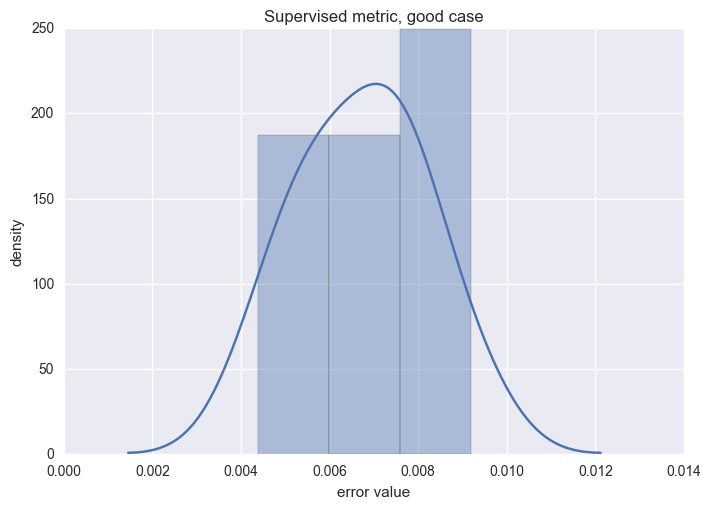

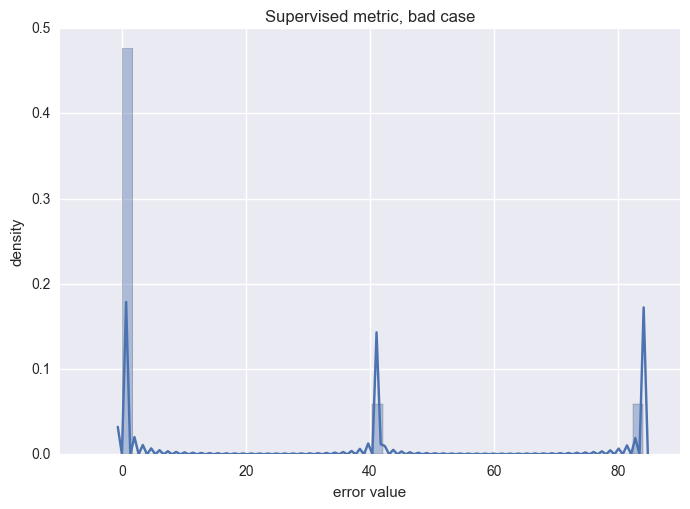

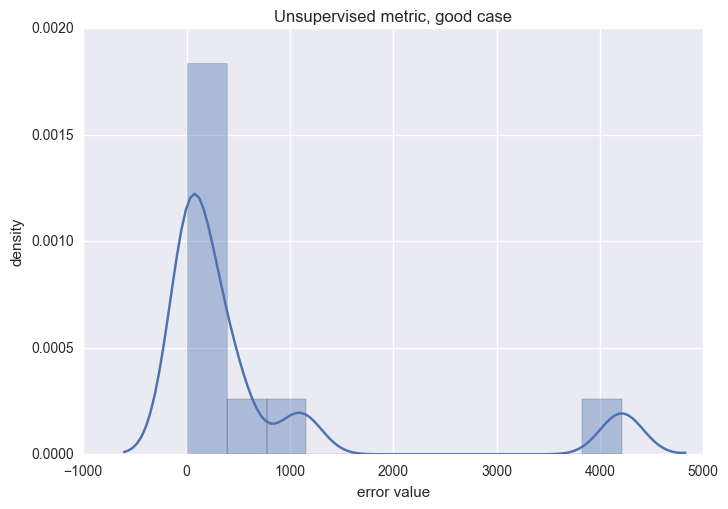

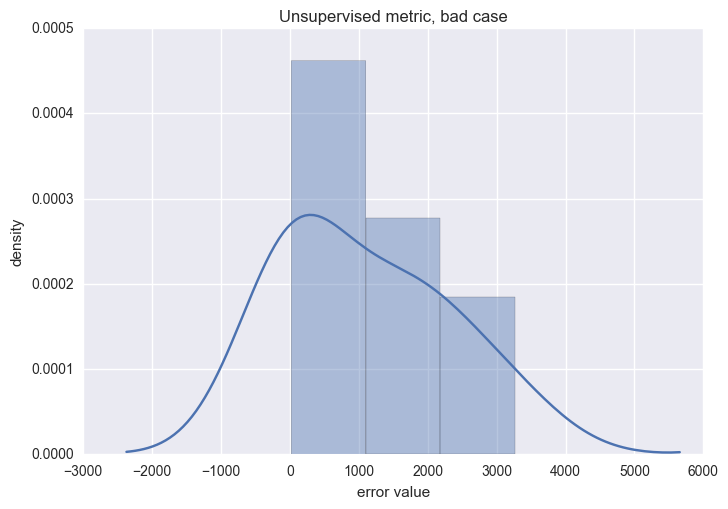

In [14]:
plot_histogram(supg, "Supervised metric, good case")
plot_histogram(supb, "Supervised metric, bad case")
plot_histogram(unsupg, "Unsupervised metric, good case")
plot_histogram(unsupb, "Unsupervised metric, bad case")

### 6. Run quantitative analysis

In [15]:
print quant(supg, "Supervised metric, good case:")
print quant(supb, "Supervised metric, bad case:")
print quant(unsupg, "Unsupervised metric, good case:")
print quant(unsupb, "Unsupervised metric, bad case:")

('Supervised metric, good case:', 0.0067263767127504811)
('Supervised metric, bad case:', 12.688500632581485)
('Unsupervised metric, good case:', 641.98628744469693)
('Unsupervised metric, bad case:', 1093.8648375903151)


### 7. completed in parallel with good case
### 8. Summarize
It is clear from the computed metrics and qualitative plots that the 'good' case outperformed the 'bad' case in the metric we described.

## Synthetic Data Analysis

### 1. Describe how we will simulate the raw data
We will generate time series as in the 'good' simulation case described above, one for each of the 111 channels in the real data. These time series will also have 70,000 time steps rather than 5000 in the simulation.

In [16]:
def generate_eeg_data():
    channels = []
    gold = []
    for i in range(111):
        sg, ng, spng, indg = gen_data(70000, (1, 5), (1, 5), 5, 5)
        channels.append(spng)
        gold.append(sg)
    return np.array(channels).T, np.array(gold).T
data, gold = generate_eeg_data()

### 2. Plot synthetic data
We will only plot the first 100 time points, as this is a high dimensional data set.

In [17]:
pd.DataFrame(data=data[:10000:100, :]).iplot(kind='line',
                                      title='Synthetic Data Noisy',
                                      xTitle='time (milliseconds)',
                                      yTitle='amplitude (microVolts)')
pd.DataFrame(data=gold[:10000:100, :]).iplot(kind='line',
                                      title='Synthetic Data Real',
                                      xTitle='time (milliseconds)',
                                      yTitle='amplitude (microVolts)')

### 3. Describe expectations
This algorithm should work well on the synthetic data, since it appeared to work well on the simulation above and this algorithm will just repeat that process for each channel.

### 4. Wrapper function

In [18]:
k_hyp = [2,3]
n_hyp = [50, 200, 500, 1000]
def algorithm(data, k_hyp, n_hyp):
    pred = []
    dim = [len(k_hyp), len(n_hyp)]
    for c in range(data.shape[1]):
        errsg = np.zeros(dim)
        for i, k in enumerate(k_hyp):
            for j, n in enumerate(n_hyp):
                _, erg = nad(data[:, c], k, n)
                errsg[i, j] = erg 
        bestg = np.unravel_index(np.argmin(errsg), dim) 
        predg, erg = nad(data[:, c], k_hyp[bestg[0]], n_hyp[bestg[1]])
        pred.append(predg)
    return np.array(pred)

### 5. Call function using synthetic data

In [19]:
eeg_data, gold = generate_eeg_data()
pred = algorithm(eeg_data, k_hyp, n_hyp)

### 6. Generate plots and give quantitative figures

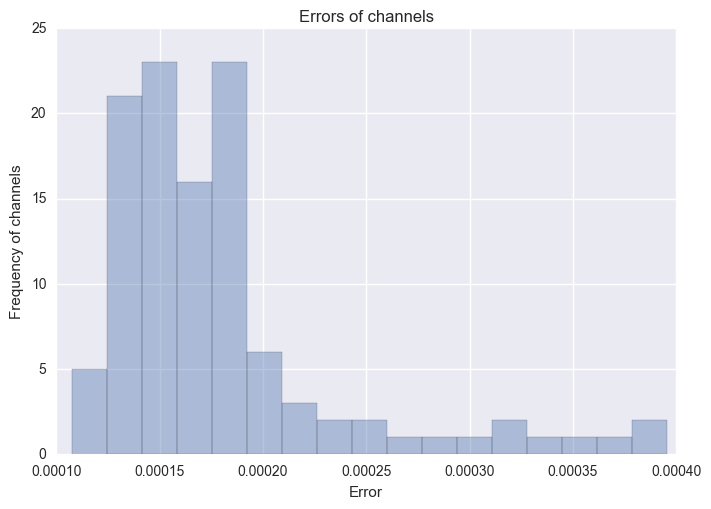

In [20]:
pd.DataFrame(data = pred.T[1000::100, :]).iplot(kind='line')
errors = []
for c in range(111):
    errors.append(quantify_gold(pred.T[:, c], gold[:, c]))
errors = np.array(errors)
sns.distplot(errors, kde=False, norm_hist=False)
plt.title("Errors of channels")
plt.ylabel("Frequency of channels")
plt.xlabel("Error")
plt.show()

## Real Data Analysis
### 1. Predict performance accuracy
* EEG data
  For the EEG data, the algorithm should perform relatively well, but it can be expected that one or more of the channels may go poorly (since there are outliers in this process and it appears sometimes the fitted signal is extremely bad).

* Heart rate monitor
  For the heart rate information the algorithm should not perform as good as the EEG data, since it is much more jagged (very spiky signal).

### 2. Run same code on real data

In [21]:
pred2 = algorithm(eeg_data2, k_hyp, n_hyp)

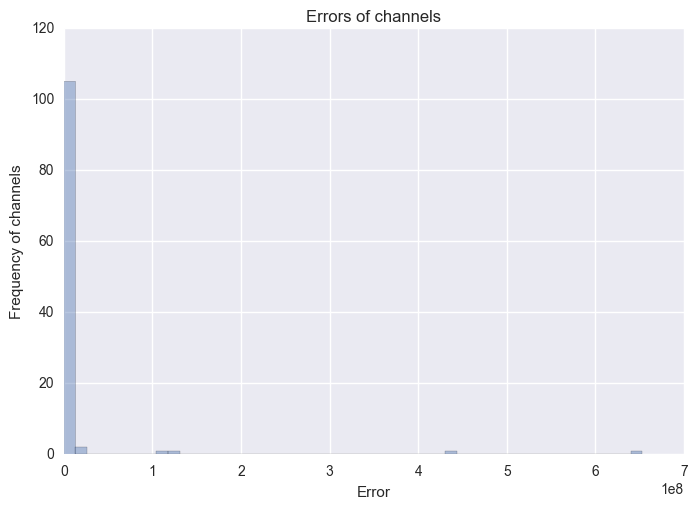

In [22]:
pd.DataFrame(data = pred.T[1000::100, :]).iplot(kind='line')
errors = []
for c in range(111):
    errors.append(quantify_not_gold(pred2.T[:, c], eeg_data2[:, c]))
errors = np.array(errors)
sns.distplot(errors, kde=False, norm_hist=False)
plt.title("Errors of channels")
plt.ylabel("Frequency of channels")
plt.xlabel("Error")
plt.show()

In [23]:
k_hyp = [2,3]
n_hyp = [10, 20, 200]

pred3 = algorithm(heart.reshape(heart.shape[0],1), k_hyp, n_hyp)

In [24]:
print heart.shape, pred3.shape
show = np.column_stack([heart, pred3.T])
pd.DataFrame(data = show, columns=['True', 'Predicted']).iplot(kind='line',
                                                               title='Heart Beat vs Denoised Heart Beat',
                                                               xTitle = 'Time',
                                                               yTitle = 'Amplitude')
print 'Error: ', quantify_not_gold(pred3.T, heart)

(1800,) (1, 1800)


Error:  0.00763113189818


### 3. Document performance.
Performance went quite well. There were a few outlier channels which made large mistakes, as can be seen in the histogram, but for the most part the noise reduced signals are simpler (made of length 1000 low degree polynomials) and are still very close to the original signal (good reconstruction accuracy).


### 4. Opinion on extensibility
Because of the robustness of this algorithm (simplicity, deterministic, and guaranteed to converge with much data and high orders), we expect it to work on really any time series data set. Limitations seem to be numerical errors which occur when the plot is near 0, but this is solved by translating the entire time series up on the y axis. I believe since this method is model free it can be applied quite liberally to a variety of situations. This method can also possibly be used on real time data.

### 5. Performance improvement
* meta-learning the hyperparameters -- this algorithm has two hyper-parameters k and n (polynomial order and window radius). Here is implemented a naive hyperparameter search, however, a more sophisticated algorithm may improve performance.
* more overlapping: by windowing more agressively it could be possible to have 3 windows overlapping at a time, which may lead to a smoother signal.
* non-linear drop off for the averaging of overlapping regions: currently the reconstructed signal is built from values of the overlapping time series segments where weighting is a simple distance from the middle of the window. Implementing non-linear drop-off functions for this may make the signals smoother.